# In-Domain GAN

- [`happy-jihye`](https://github.com/happy-jihye)
- IdInvert : In-Domain GAN Inversion for Real Image Editing (ECCV 2020) : [arxiv](https://arxiv.org/abs/2004.00049), [review](https://happy-jihye.github.io/gan/gan-23/)
- reference : [`bryandlee/stylegan2-encoder-pytorch`](https://github.com/bryandlee/stylegan2-encoder-pytorch)

In [21]:
import os
import random
import numpy as np
import natsort
import imageio

import torch
from torch import nn
import torch.nn.functional as F

import torchvision
from torchvision import datasets, transforms

from model import Generator, Encoder
from train_encoder import VGGLoss

import matplotlib.pyplot as plt

In [6]:
device = 'cuda'
image_size = 256
latent_dim = 512

# Generator
network1 = 'networks/550000.pt'
network1 = torch.load(network1)

generator = Generator(image_size, latent_dim, 8, channel_multiplier=2).to(device)
generator.load_state_dict(network1["g_ema"], strict=False)
generator.eval()
print('[generator loaded]')


# Encoder
network2 = 'networks/encoder_ffhq.pt'
network2 = torch.load(network2)

encoder = Encoder(image_size, latent_dim).to(device)
encoder.load_state_dict(network2["e"])
encoder.eval()
print('[encoder loaded]')

[generator loaded]
[encoder loaded]


## Domain-Guided Encoder

In [7]:
batch_size = 2

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

dataset = datasets.ImageFolder(root='voxceleb2', transform=transform)
loader = iter(torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True))

imgs, _ = next(loader)
imgs = imgs.to(device)

initial projections:


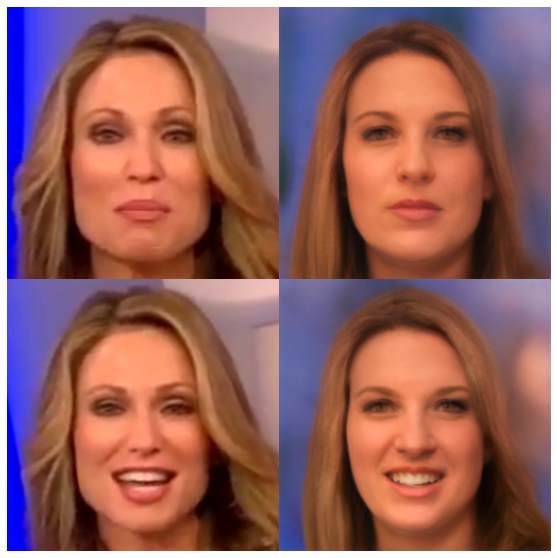

In [11]:
from utils import tensor2image, imshow

truncation = 0.7
trunc = generator.mean_latent(4096).detach().clone()

with torch.no_grad():
    z0 = encoder(imgs)
    imgs_gen, _ =  generator([z0], 
                           input_is_latent=True,
                           truncation=truncation,
                           truncation_latent=trunc,
                           randomize_noise=False)

imgs_real = torch.cat([img for img in imgs], dim=1)
imgs_fakes = torch.cat([img_gen for img_gen in imgs_gen], dim=1)

print('initial projections:')
imshow(tensor2image(torch.cat([imgs_real, imgs_fakes], dim=2)),10)

## Domain-regularized Optimization (500 steps)

step:100, loss:1.5087488889694214


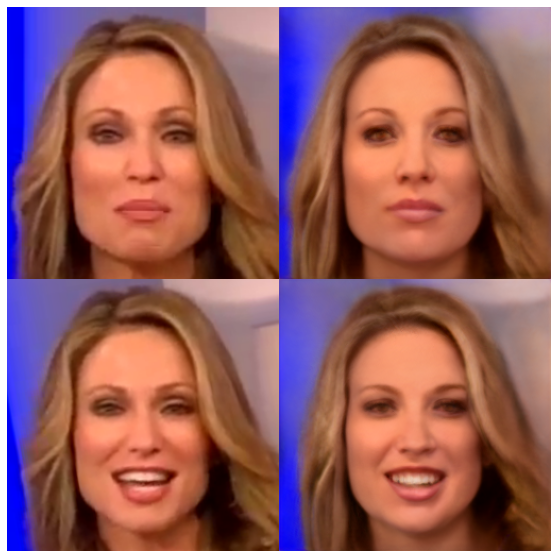

step:200, loss:1.1923283338546753


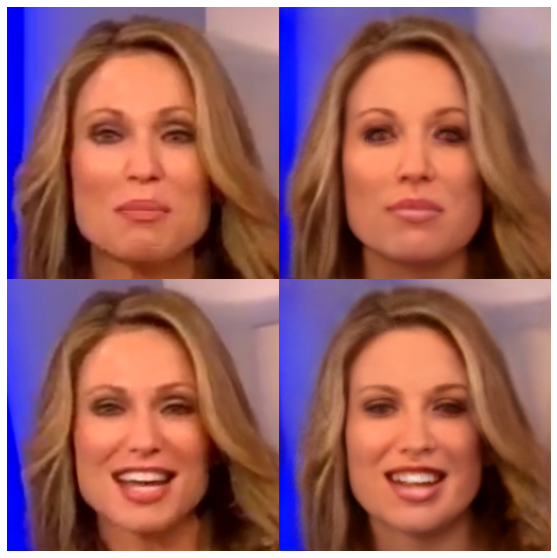

step:300, loss:1.0298186540603638


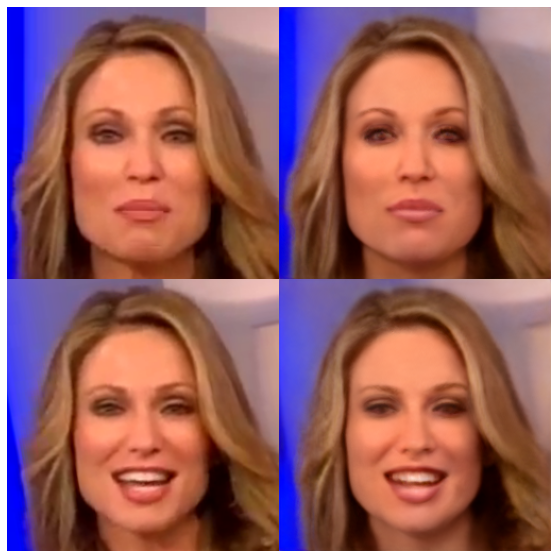

step:400, loss:0.9311890006065369


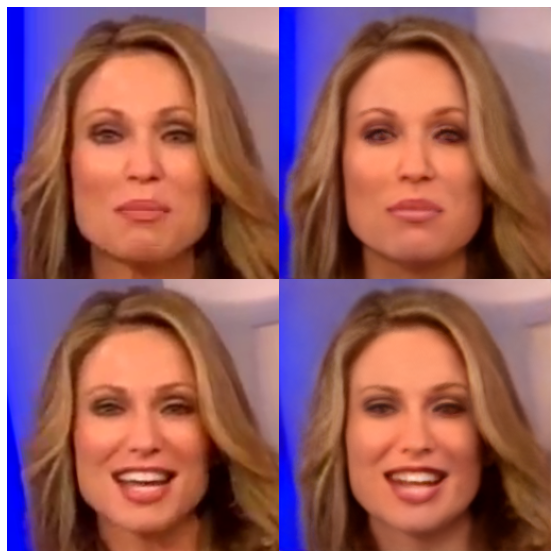

step:500, loss:0.8686383962631226


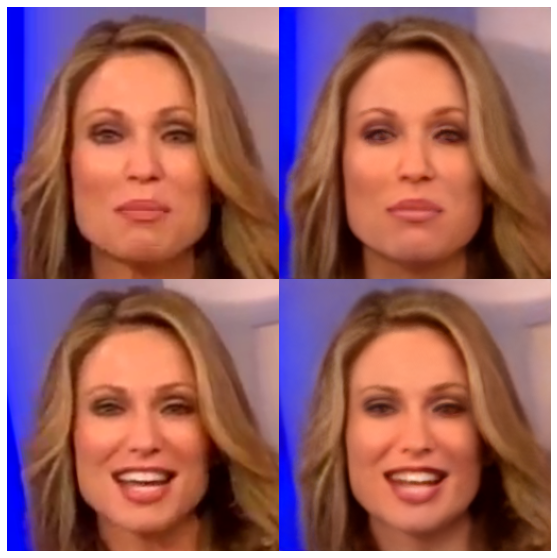

In [12]:
from train_encoder import VGGLoss

vgg_loss = VGGLoss(device)

z = z0.detach().clone()

z.requires_grad = True
optimizer = torch.optim.Adam([z], lr=0.01)

for step in range(500):
    imgs_gen, _ = generator([z], 
                           input_is_latent=True, 
                           truncation=truncation,
                           truncation_latent=trunc, 
                           randomize_noise=False)

    z_hat = encoder(imgs_gen)
    
    loss = F.mse_loss(imgs_gen, imgs) + vgg_loss(imgs_gen, imgs) + F.mse_loss(z0, z_hat)*2.0
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step() 
    
    if (step+1)%100 == 0:
        print(f'step:{step+1}, loss:{loss.item()}')
        imgs_fakes = torch.cat([img_gen for img_gen in imgs_gen], dim=1)        
        imshow(tensor2image(torch.cat([imgs_real, imgs_fakes], dim=2)),10)

## Interpolation

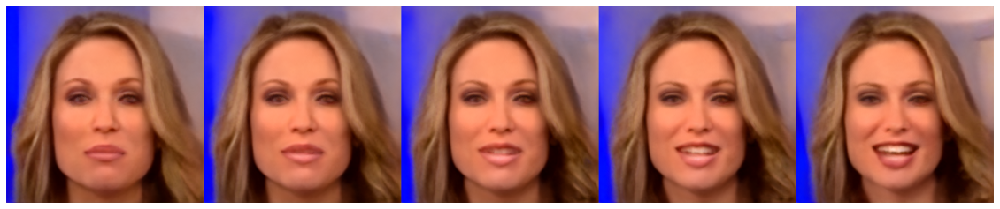

In [13]:
n_interp = 5
latent_interp = torch.zeros(n_interp, z.shape[1], z.shape[2]).to(device)

with torch.no_grad():
    for j in range(n_interp):
        latent_interp[j] = (float(n_interp-j-1) * z[0] + float(j) * z[1])/(n_interp-1)
    
        imgs_gen, _ = generator([latent_interp],
                                input_is_latent=True,                                     
                                truncation=truncation,
                                truncation_latent=trunc,
                                randomize_noise=False)

imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen], dim=2)), 20)


In [14]:
# Generator
network = 'networks/632000.pt'
network = torch.load(network)

generator2 = Generator(image_size, latent_dim, 8, channel_multiplier=2).to(device)
generator2.load_state_dict(network["g_ema"], strict=False)
generator2.eval()
print('[generator loaded]')

[generator loaded]


### Domain-Guided Encoder + Cartoon-StyleGAN

You can download Cartoon-StyleGAN checkpoints in [here](https://github.com/happy-jihye/Cartoon-StyleGAN) !

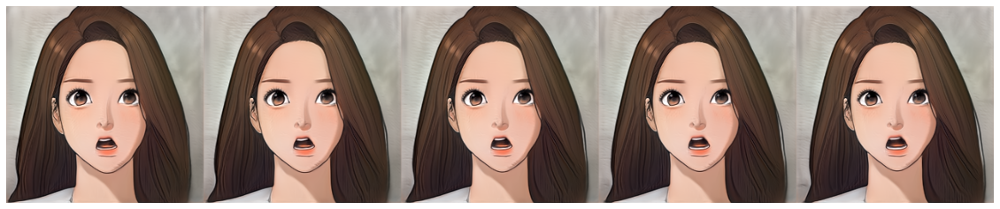

In [17]:
n_interp = 5
latent_interp = torch.zeros(n_interp, z.shape[1], z.shape[2]).to(device)

with torch.no_grad():
    for j in range(n_interp):
        latent_interp[j] = (float(n_interp-j-1) * z0[0] + float(j) * z0[1])/(n_interp-1)
    
        imgs_gen, _ = generator2([latent_interp],
                                input_is_latent=True,                                     
                                truncation=truncation,
                                truncation_latent=trunc,
                                fine_tune = True,
                                randomize_noise=False)

imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen], dim=2)), 20)

### Domain-regularized Optimization (500 steps) + Cartoon-StyleGAN

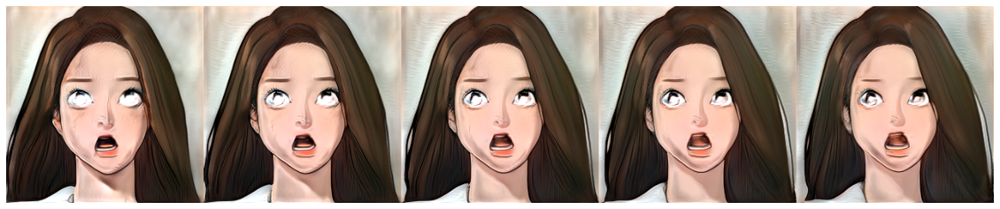

In [16]:
n_interp = 5
latent_interp = torch.zeros(n_interp, z.shape[1], z.shape[2]).to(device)

with torch.no_grad():
    for j in range(n_interp):
        latent_interp[j] = (float(n_interp-j-1) * z[0] + float(j) * z[1])/(n_interp-1)
    
        imgs_gen, _ = generator2([latent_interp],
                                input_is_latent=True,                                     
                                truncation=truncation,
                                truncation_latent=trunc,
                                fine_tune = True,
                                randomize_noise=False)

imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen], dim=2)), 20)

## Make Video

In [25]:
image_size=256
batch_size = 50

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

dataset = datasets.ImageFolder(root='voxceleb2', transform=transform)
dataloader = torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=False)
loader = iter(dataloader)
imgs, _ = next(loader)
imgs = imgs.to(device)

### 1. Original Video

In [22]:
speed_sec = { 'duration': 0.1 } #사진 넘기는 시간

image_path = 'voxceleb2/all'
image_list = natsort.natsorted(os.listdir(image_path))

image_paths = [ os.path.join(image_path, im) for im in image_list if im.endswith('.png')] #[256,256,3] 
image_paths = image_paths[:50]
print(image_paths[0])

images = []

for im in image_paths:
    images.append(imageio.imread(im))
    
imageio.mimsave('vox2-ori.gif', images, **speed_sec)

voxceleb2/all/align-00517.png


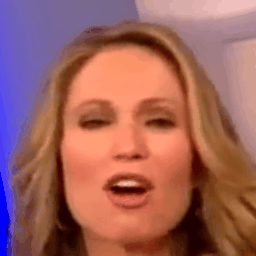

In [23]:
from IPython.display import Image
Image(open('vox2-ori.gif','rb').read())

### 2. Domain-Guided Encoder

In [26]:
truncation = 0.7
trunc = generator.mean_latent(4096).detach().clone()

with torch.no_grad():
    z0 = encoder(imgs)
    imgs_gen, _ =  generator([z0], 
                           input_is_latent=True,
                           truncation=truncation,
                           truncation_latent=trunc,
                            fine_tune=False,
                           randomize_noise=False)
    
images = [tensor2image(imgs_gen[i]) for i in range(len(imgs_gen))]

In [27]:
speed_sec = { 'duration': 0.1 } #사진 넘기는 시간

imageio.mimsave('vox2-enc.gif', images, **speed_sec)

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0

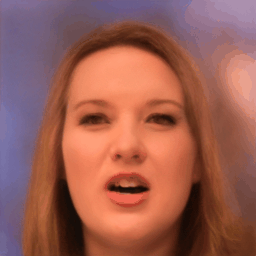

In [28]:
from IPython.display import Image
Image(open('vox2-enc.gif','rb').read())

### 3. Cartoon-StyleGAN

In [31]:
truncation = 0.7
trunc = generator2.mean_latent(4096).detach().clone()

with torch.no_grad():
    z0 = encoder(imgs)
    imgs_gen, _ =  generator2([z0], 
                           input_is_latent=True,
                           truncation=truncation,
                           truncation_latent=trunc,
                            fine_tune=True,
                           randomize_noise=False)
    
images = [tensor2image(imgs_gen[i]) for i in range(len(imgs_gen))]

In [32]:
speed_sec = { 'duration': 0.1 } #사진 넘기는 시간

imageio.mimsave('vox2-finetuning.gif', images, **speed_sec)

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0

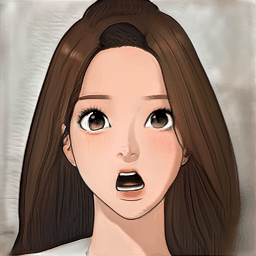

In [33]:
from IPython.display import Image
Image(open('vox2-finetuning.gif','rb').read())